
------

# **`Waste Detection Using Yolov5`**

### **Author** : **Muhammad Adil Naeem**
### **Contact** : **madilnaeem0@gmail.com**


------

## **`Objectives:`**

- In this notebook we will experiment with our data.

- First we will **Clone Yolov5 Repository**.

- Then we will download our **Custom Data**.

- We will **define our Required Model** Configuration and architecture.

- We we change no of prediction **classess** according to **our custom data**.

- **Train the model** on our **custom data** and visualize the results.

- Export the **best model** for prediction.

-----



### **Check GPU Type**


- In **Google Colab** just change your **runtime type** to **T4 GPU**.


### **Clone YOLOv5 Repository**

- One of the ways to use **YOLOv5** is to clone it's repository. Now we will clone repository.

In [2]:
!git clone https://github.com/ultralytics/yolov5.git

Cloning into 'yolov5'...
remote: Enumerating objects: 17067, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (33/33), done.
remote: Total 17067 (delta 24), reused 28 (delta 12), pack-reused 17022 (from 1)
Receiving objects: 100% (17067/17067), 15.68 MiB | 16.16 MiB/s, done.
Resolving deltas: 100% (11719/11719), done.


In [3]:
# change directory to yolov5
%cd yolov5

/content/yolov5


### **Install Dependencies as necessary**

- We need to install the necessory libraries to use power of **Yolov5**.

In [4]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
# from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 37.4 MB/s eta 0:00:00
Setup complete. Using torch 2.5.1+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40, uuid=00cc83cc-6fb8-b75b-e34b-c700c66a809d, L2_cache_size=4MB)



## **Download Custom Data**


- We need to download our data to train **Yolov5** model.



In [5]:
# check current directory
!pwd

/content/yolov5


In [6]:
# change directory
%cd /content

/content


### **Set `gdrive url` of `Custom Data`**

In [7]:
url = "https://drive.google.com/file/d/1ECfl3dtYyfivY8kYPq7RHUBTjC-2vf61/view?usp=share_link"

### **Select `id` of data from Link**

In [8]:
# Split the URL string by the "/" character and get the last second element.
# This typically represents the file ID in a specific URL structure.
file_id = url.split("/")[-2]

# Store the extracted file ID in the variable 'file_id'.
file_id

'1ECfl3dtYyfivY8kYPq7RHUBTjC-2vf61'

### **Download `Dataset` from `Google Drive`**

In [9]:
# use gdown package to download data from gdrive
import gdown

# Define the base URL for downloading files from Google Drive.
# The URL includes the necessary parameters for export and the file ID.
prefix = 'https://drive.google.com/uc?/export=download&id='

# Use the gdown library to download the file from Google Drive.
# The complete URL is formed by concatenating the prefix with the file ID.
# The downloaded file will be saved in the "data" directory with the name "GARBAGE CLASSIFICATION.zip".
gdown.download(prefix + file_id)

print("Data downloaded!")

Downloading...
From (original): https://drive.google.com/uc?/export=download&id=1ECfl3dtYyfivY8kYPq7RHUBTjC-2vf61
From (redirected): https://drive.google.com/uc?%2Fexport=download&id=1ECfl3dtYyfivY8kYPq7RHUBTjC-2vf61&confirm=t&uuid=3887c31e-270f-40f0-895f-9a1b0bfcba6c
To: /content/waste-detection.zip
100%|██████████| 40.1M/40.1M [00:00<00:00, 139MB/s]

Data downloaded!


#### **Unzip Downloaded Data**

In [10]:
# Unzip the 'waste-detection' file quietly (suppressing output)
!unzip -q waste-detection

print("Data unzipped!")

Data unzipped!


In [11]:
# Remove the 'waste-detection' file and its contents recursively and forcefully
!rm -rf waste-detection

print("Data removed!")

Data removed!


#### **Load `YAML` File present inside the Data**

-  We're loading `YAML file` into this notebook with our data. This contain complete information about our data.

In [12]:
%cat data.yaml

train: ../train/images
val: ../valid/images


nc: 13
names: ['banana', 'chilli', 'drinkcan', 'drinkpack', 'foodcan', 'lettuce', 'paperbag', 'plasticbag', 'plasticbottle', 'plasticcontainer', 'sweetpotato', 'teabag', 'tissueroll']



### **Define `Model Configuration` and Architecture**

- We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

- You do not need to edit these cells, but you may.

In [13]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [14]:
# check number of classess
num_classes

'13'

### **We will use Yolov5s**

- We know that **Yolo** is trained on **COCO** Dataset which has **80** classess.

- We just need to adjust classess according to our data to work with it.

- We will specifically use **Yolov5s** version.

In [15]:
# this is the model configuration we will use
%cat /content/yolov5/models/yolov5s.yaml

# Ultralytics YOLOv5 🚀, AGPL-3.0 license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4],

#### **Change Number of classess according to our data**

- Since we are working with **Jupyter notebook** so we will use this code to perform the adjustment of classess.

In [16]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

- We will copy **/content/yolov5/models/yolov5s.yaml** content for editing.

In [17]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## **Train Custom YOLOv5 Detector**

**Next, we'll fire off training!
Here, we are able to pass a number of arguments:**

- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- cfg: specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive folder)

- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

### **Train yolov5s on custom data for 100 epochs**

In [18]:
# Measure the execution time of the following cell
%%time

# Change the current working directory to the Yolov5 directory
%cd /content/yolov5/

# Execute the training script with specified parameters:
# --img: Set image size to 416 pixels
# --batch: Use a batch size of 16
# --epochs: Train for 50 epochs
# --data: Specify the data configuration file
# --cfg: Use the custom model configuration file
# --weights: Load pre-trained weights from 'yolov5s.pt'
# --name: Set the name for the output results
# --cache: Cache images for faster training
!python train.py --img 416 --batch 16 --epochs 150 --data '../data.yaml' --cfg ./models/custom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results --cache

Streaming output truncated to the last 5000 lines.
    108/149      1.99G    0.02265    0.01223    0.01192         37        416:  91% 53/58 [00:12<00:00,  5.72it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    108/149      1.99G    0.02261    0.01226    0.01205         49        416:  93% 54/58 [00:12<00:00,  5.60it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    108/149      1.99G    0.02257    0.01223    0.01203         44        416:  95% 55/58 [00:12<00:00,  5.83it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    108/149      1.99G    0.02261    

## **Evaluate Custom YOLOv5 Detector Performance**

- Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

- Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

### **Initialize Tenserboard to Uderstand Results**

In [19]:
# Load the TensorBoard extension to visualize training metrics
%load_ext tensorboard

# Launch TensorBoard to view logs
# --logdir: Specify the directory where logs are saved (in this case, "runs")
# This should be run after starting the training process to visualize the results
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

#### **Plot results manually if tenserboard doesnot work**

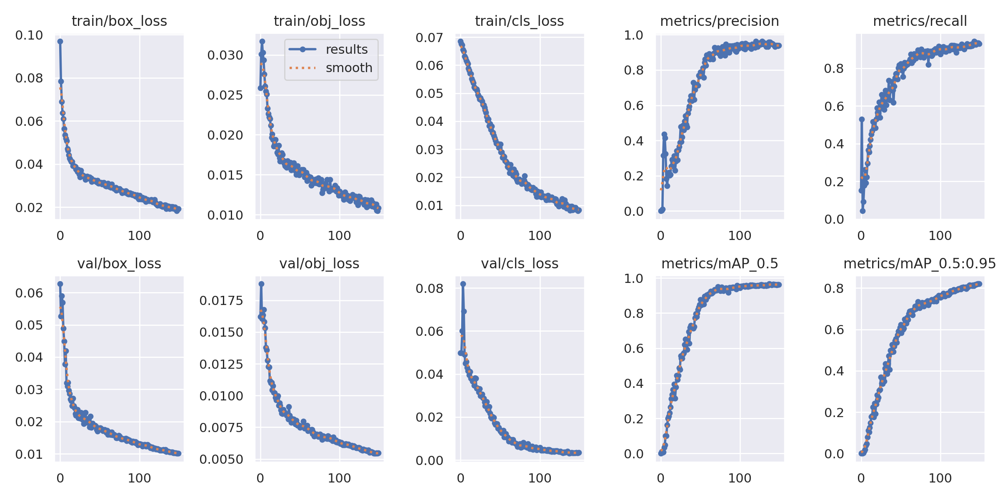

In [20]:
# If TensorBoard is not functioning for any reason, we can generate traditional plots instead
from utils.plots import plot_results  # Import the function to plot results from 'results.txt' as 'results.png'

# Display the generated 'results.png' image with a width of 1000 pixels
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # View the results image


#### **Curious? Visualize Our Training Data with Labels**

- After training starts, view train*.jpg images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in YOLOv4.

- (In this context, "ground truth" refers to the actual, manually labeled data used as a reference for training and evaluating a model. It represents the true values or categories that the model aims to predict, serving as a benchmark to assess the model's performance. In object detection tasks, this often includes the correct labels and bounding boxes for objects in images.)

#### **GROUND TRUTH TRAINING DATA**

GROUND TRUTH TRAINING DATA:


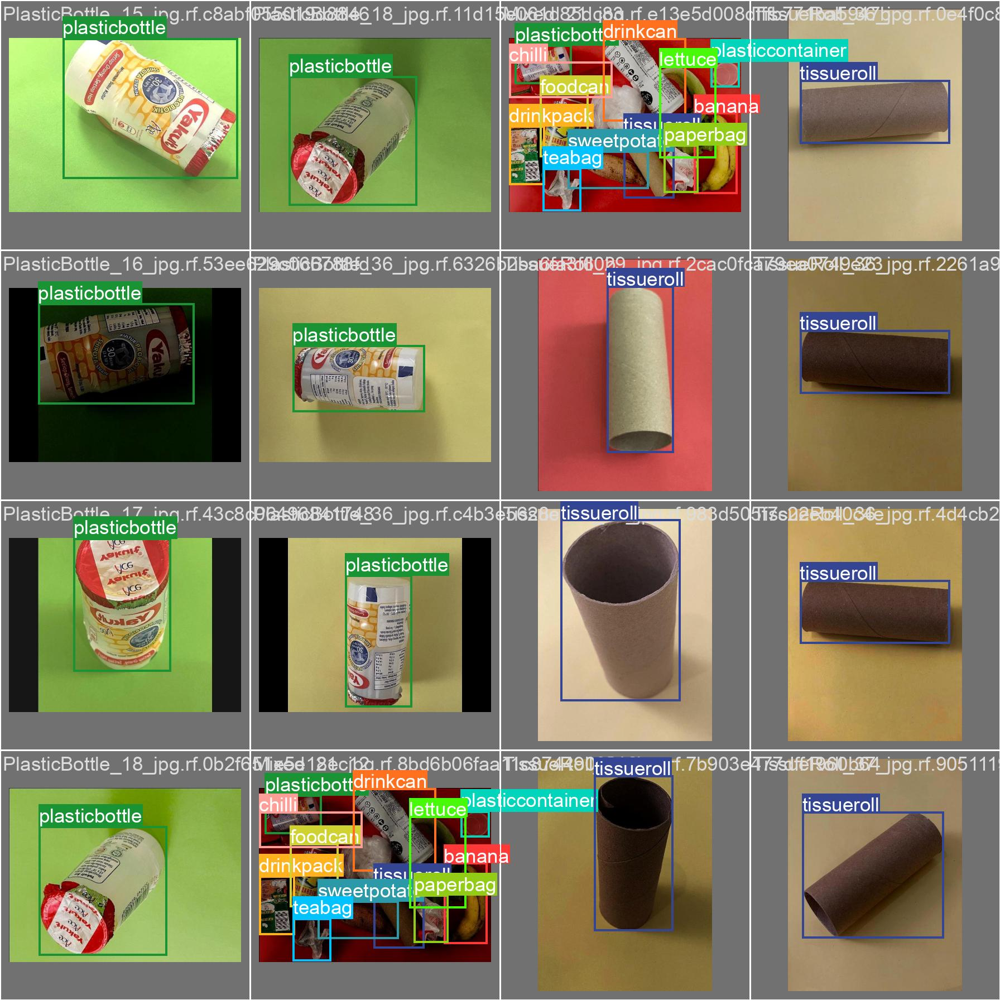

In [21]:
# First, display our ground truth data for reference
print("GROUND TRUTH TRAINING DATA:")  # Print a message indicating that the ground truth data is being displayed

# Display the ground truth labels for the first batch of validation images
# The image is loaded from the specified file with a width of 900 pixels
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

#### **GROUND TRUTH AUGMENTED TRAINING DATA**

GROUND TRUTH AUGMENTED TRAINING DATA:


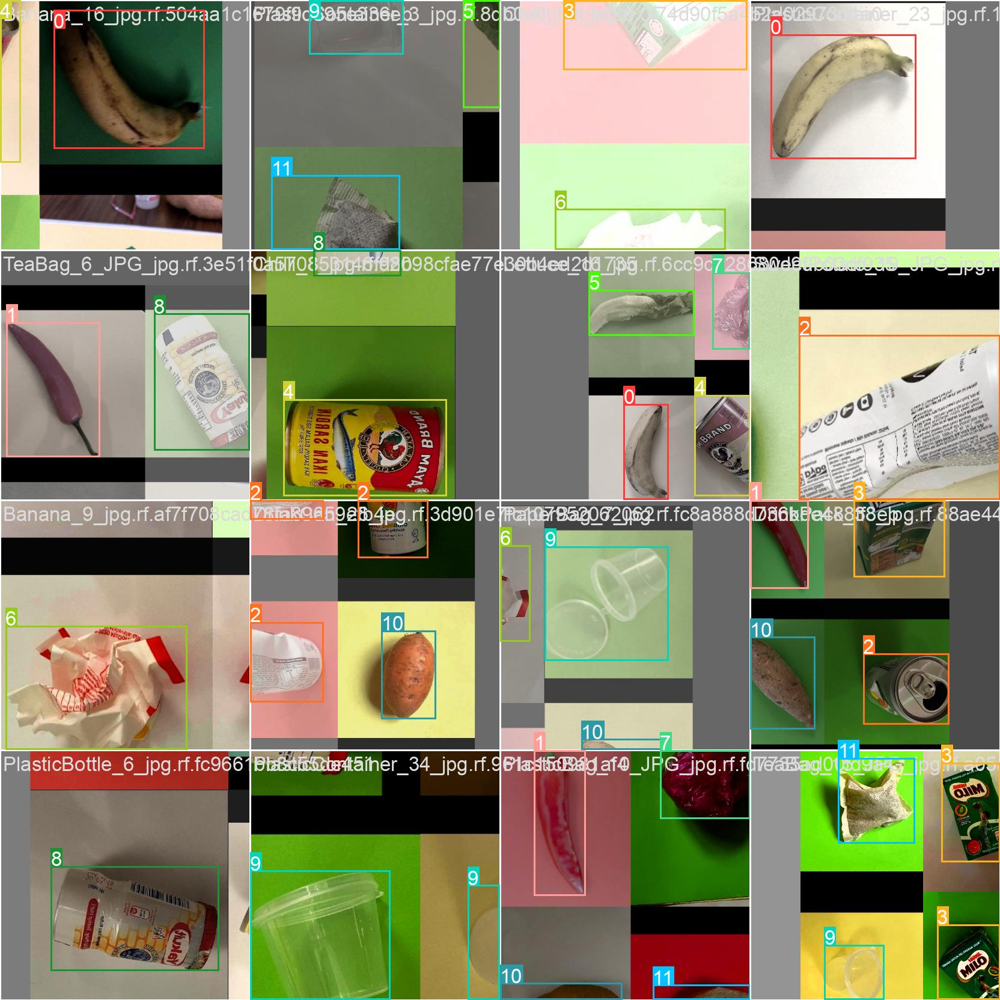

In [22]:
# Print out an augmented training example for visual inspection
print("GROUND TRUTH AUGMENTED TRAINING DATA:")  # Indicate that the augmented training data is being displayed

# Display the augmented training image for the first batch
# The image is loaded from the specified file with a width of 900 pixels
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#### **Run Inference With Trained Weights**

- Run inference with a pretrained checkpoint on contents of test/images folder downloaded from Roboflow.



In [23]:
# trained weights are saved by default in our weights folder
%ls runs/

train/


In [24]:
# List the contents of the 'weights' directory within the 'yolov5s_results' folder
# This command displays the files saved as part of the training process, such as model weights
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


#### **Running Object Detection Using YOLOv5 with Best Trained Weights**

In [28]:
# When we ran this, we observed an inference time of 0.007 seconds, equivalent to 140 frames per second (FPS) on a Tesla P100 GPU!
# Now, we will use the best weights obtained from the training.

# Change the current working directory to the Yolov5 directory
%cd /content/yolov5/

# Execute the detection script with the specified parameters:
# --weights: Use the best model weights saved during training
# --img: Set the image size to 416 pixels for detection
# --conf: Set the confidence threshold for detections to 0.5
# --source: Specify the source of images for detection (in this case, images from the validation set)
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.5 --source ../valid/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-388-g882c35fc Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7278882 parameters, 0 gradients
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/459 /content/valid/images/Banana_10_jpg.rf.0f4f5f5b749f5681048000d59b667d94.jpg: 416x320 1 banana, 30.9ms
image 2/459 /content/valid/images/Banana_10_jpg.rf.5d587c81371bd16a3a5eba3af30ce089.jpg: 416x320 1 banana, 7.6ms
image 3/459 /content/valid

## **Export Trained Weights for Future Inference**

- Now that you have trained your custom detector, you can export the trained weights you have made here for inference on your device elsewhere

In [31]:
# Import the drive module from Google Colab to enable access to Google Drive
from google.colab import drive

# Mount Google Drive to the Colab environment at the specified path ('/content/gdrive')
# This allows you to read and write files to your Google Drive directly from Colab
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [33]:
# Copy the best model weights file from the Yolov5 training results directory
# to a specified location in Google Drive for storage or future use
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/gdrive/MyDrive/Research/Waste_Detection_Using_Yolo_v5/prediction_model

print("Prediction Model Exported")

Prediction Model Exported


## `That's It`

- You are free to make Predictions.

------